# The filter prior $p(\theta^F|F^R,\hat T)$

$$\theta^F = (x,y,g) $$

Similar to the source prior, we fit our prior to a some ground-truth data (i.e., $F^R$), partially theoretically reconstructed (i.e., $B^R$):

$$p(F^R,B^R,\hat T)$$

**So we look for**

$$p(x,y|F^R,B^R,\hat T)$$

and construct an ad-hoc least-squares **cost function** $L(x,y,g) = p(F^R,B^R|x,y,g)$ based on our spectrum heuristics:
- Measured $F$ must be close to $F^R$ of sample
- Measured $B$ must be close to $B^R$ of sample
- Measured tilt must be close to -2 +/- 6 dB (see tilt.ipynb) **and measured from $F_3^R$**. This is necessary for more accurate measurements (especially on super smooth analytical spectra like we are dealing with in this inference problem). For empirical measurements -- as done in tilt.ipynb -- we simply use $F_g$, the glottal formant, because this is roughly the point at which the spectrum of the source wave starts decaying (i.e. the glottal "filter"'s cutoff point) per Doval+ (2006). The strategy of using $F_g$ works very well.

Note that
- The cost function is independent of overal scale of the fitted transfer function $\tilde h(x;p)$
- Sensitivies ($\sigma$'s) of $F$ and $B$ are loosely based on values given in Pinson (1952).
- We never construct a power spectrum from the samples; we only take in $(F^R, B^R, \hat T)$.

Inferring $x,y$, we then, as usual, construct a nonlinear coloring bijector from the samples $(x,y,F^R, B^R, \hat T)$. This then allows us to constrain $F^R$ and $\hat T$ to Praat's estimates.

## Fitting PZ and AP

Note that we did not mention $g$ in the fit, even though the power transfer function $\hat h(x,p,g)$ requires these amplitudes.

In both AP and PZ cases we derive a ME prior $p(g|x,y)$ based on the expected impulse response energy $\mathcal E$, which is Gaussian in both cases.
We don't actually infer $p(x,y,g|F^R,B^R,\hat T)$ (even though we could) because
- More elegant implementation and complete conformity with how we do it for source amps: source amplitudes $f$ are also given by analytical (Hilbert-GP) prior determined by prior constraints (power, scale, integrating to zero, etc.). (See "the complete picture" subsubsection below about this symmetry).
- Tests showed that nothing was actually being learned: the posterior of $g$ was very similar to its prior -- this shows that the prior ME constraint is much stronger then the constraints imposed by our ad-hoc cost function
- It is inefficient (dimension becomes much larger)

So in practice we use a terribly cheap 'n' chearful **pseudo MC approach**:

$$ p(x,y|F^R,B^R) \propto \big[\int dg\ p(F^R,B^R|x,y,g) p(g|x,y) \big] p(x,y) $$

Here the integrated likelihood $L(x,y)$ is inside the big brackets. We can approximate by a pseudo-likelihood by MC integration over $g$:

$$ L(x,y) = \int dg\ p(F^R,B^R|x,y,g) p(g|x,y) \approx {1\over n} \sum_{g_{1:n} \sim p(g|x,y)} p(F^R,B^R|x,y,g) $$

In practice:
- This becomes a logsumexp operation
- We fix the random numbers to draw $g_{1:n} \sim p(g|x,y)$ beforehand the entire run, as in Giordano +(2018)
- And **we only take one sample**! This proves enough for our purposes, since we repeat the inference for 200 $(F^R,B^R,T)$ samples anyway, and our goal is to use computational resources efficiently. Note that this also ensures efficiency for the AP problem, since $L(x,y,g) \equiv L(x,y)$, as the cost function is invariant under rescaling.

### Non-amplitude priors

$$p(x,y) = p(x) p(y)$$

where
- $p(x)$ is our Pareto chain prior
- $p(y)$ is Jeffreys

So we relax the ordered $x_1 < x_2 < \ldots$ requirement for the source prior $p(x,y|F^R,\hat T)$ since it is unproductive. However the strong correlations in that prior (which are induced by $p(x)$) will place strong prior mass on one (or just a few) of the $K!$ modes, and this will enable us to use standard nested sampling algorithms/MCMC/etc. without much tuning.

### Amplitudes $g$: the complete picture

Our approach of parametrizing the transfer function with amplitudes, both AP and PZ filters, emphasizes a nice symmetry in the inverse problem:
Both source and filter consist of expansions into basis functions, which are parametrized by the source resp. filter parameters $\theta^S$ resp $\theta^F$.
They are both degenerate Gaussian processes given the $\theta^S$ resp $\theta^F$.
The Hilbert GP kernel $K(t_1, t_2)$ and the overlap matrix $S_{ij}$ play the same roles.

And indeed: for LTI systems it doesn't matter which of the signals are the "source" and which are the "filter" -- the formalism is invariant under swapping those, so our approach should too. And we choose a parametrization that guarantees that it is.

Note that the amplitudes of both source and filters follow their respective lengthscale $\lambda^S$ resp. $\lambda^R$ and their marginal prior is $N(0,I)$ because we transform the original basis functions into and orthogonal set (i.e. completing the square).

Since our likelihood function for the inverse problem is Gaussian, *one set of amplitudes* can be integrated out of the problem: either the source amps xor the filter amps. We just choose the former because there will be typically a higher number of source amps (O(64)) than filter amps (O(20)), but there is no formal reason for this choice; it depends on your interests: do you want a very high expansion order of the filter? Then integrate those amplitudes away and keep the source ones.

In [1]:
%run init.ipy

from vtr.prior import filter
from vtr.prior import polezero, allpole
from vtr.prior import bandwidth
from lib import constants
from vtr import spectrum
from lib import util

2022-12-13 15:45:54.666590: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory


## Aggregation

In [2]:
def get_TFB_row(fit):
    row = np.concatenate((
        [fit['sample']['T']],
        fit['sample']['F'],
        fit['sample']['B']
    ))
    return row

def posterior_of_fitted_TFB_values(vtfilter, K, numsamples=50):
    def process():
        for fit in filter.get_module(vtfilter).get_fitted_TFB_samples():
            if fit['K'] == K:
                row = get_TFB_row(fit)
                rows = np.repeat(row[None,:], numsamples, axis=0)
                samples = util.resample_equal(fit['results'], numsamples)
                yield np.column_stack((rows, samples))

    return np.vstack(list(process()))

In [64]:
Kpost = 10

vtfilter = allpole.AllPoleFilter(Kpost)

def randz(size=None):
    ndim = 7 + 2*Kpost
    return randn(ndim) if size is None else randn(size,ndim)

post_samples = np.vstack(posterior_of_fitted_TFB_values(vtfilter, Kpost))

[Memory]2226.5s, 37.1min: Loading get_TFB_samples...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading run_nested...
[Memory]2226.5s, 37.1min: Loading r

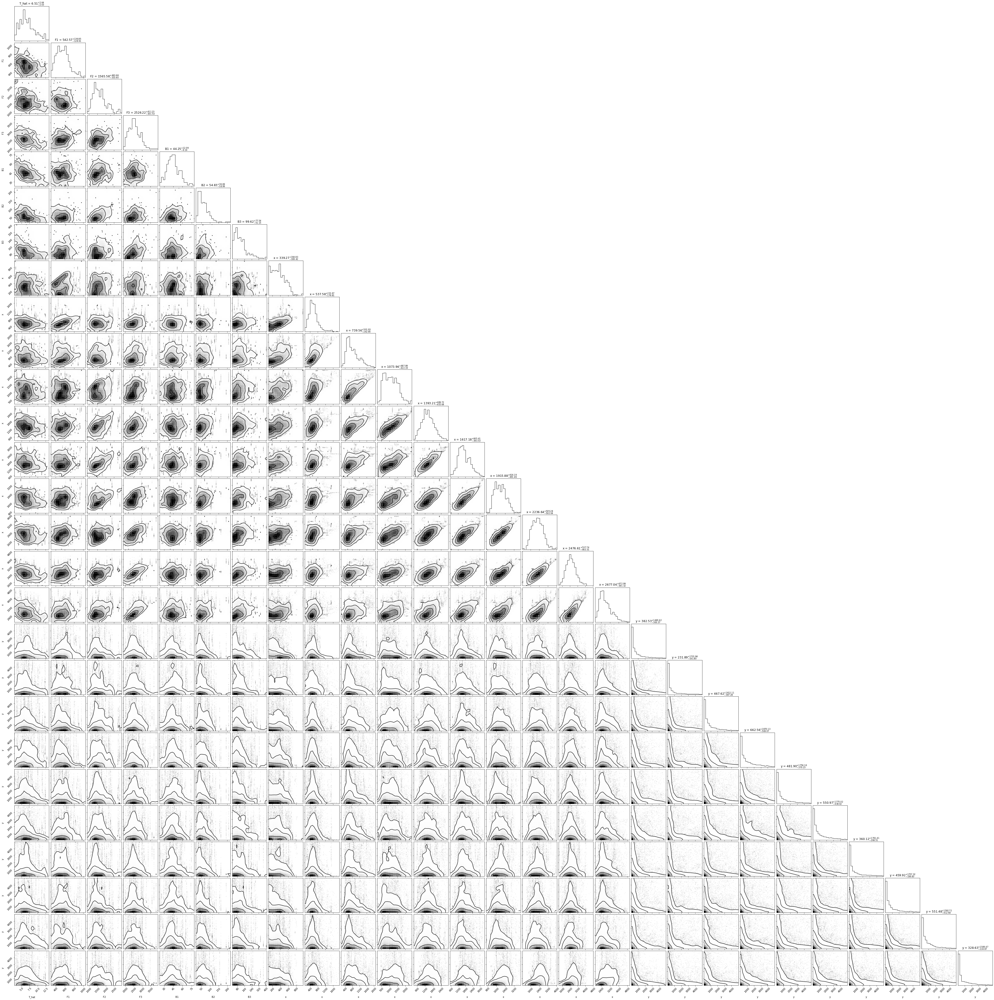

In [65]:
import corner

fig = corner.corner(
    post_samples,
    labels=(*bandwidth.TFB_NAMES, *["x"]*Kpost, *["y"]*Kpost),
    show_titles=True,
    smooth=1.
);

In [66]:
from dgf import bijectors

post_bounds = np.array([
    [(100., 5000.)]*Kpost + [(20., 5000.)]*Kpost,
]).squeeze()

post_bounds = np.vstack((bandwidth.TFB_BOUNDS, post_bounds))

samplerargs = {'nlive': Kpost} # Very little but we only care about ML point

b, bresults = bijectors.fit_nonlinear_coloring_bijector(
    post_samples, post_bounds, 123456789000000000100000111,
    samplerargs=samplerargs, return_fit_results=True
)

________________________________________________________________________________
[Memory] Calling dgf.bijectors.run_nested...
run_nested(123456789000000000100000111, {'nlive': 10}, {'save_bounds': False})


/home/marnix/thesis/py/venv/lib/python3.10/site-packages/dynesty/dynesty.py:515: UserWarning: Beware! Having `nlive <= 2 * ndim` is extremely risky!
  warnings.warn("Beware! Having `nlive <= 2 * ndim` is extremely risky!")
574it [04:33,  2.10it/s, +10 | bound: 168 | nc: 1 | ncall: 84136 | eff(%):  0.694 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-  2.060 | dlogz:  0.002 >  0.019]

_____________________________________________________run_nested - 274.3s, 4.6min


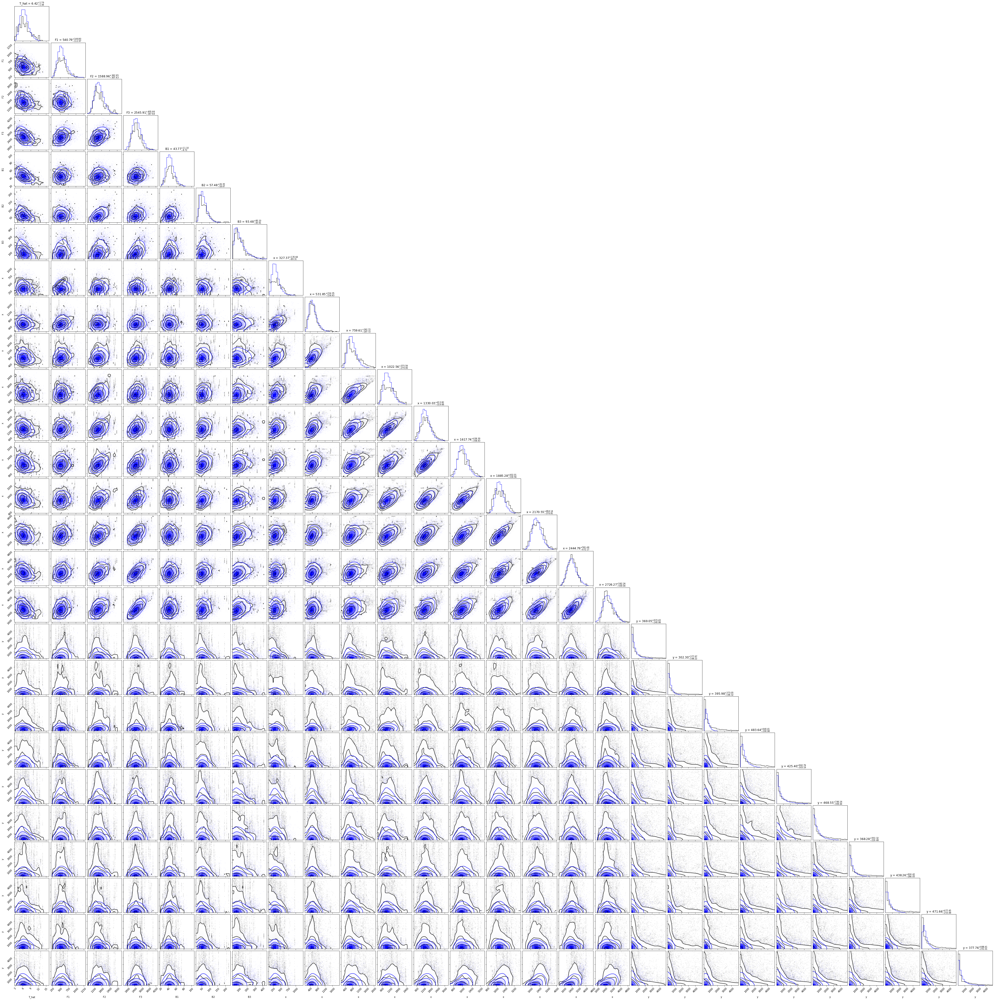

In [67]:
import corner

corner.corner(
    array(b.forward(randn(10000, 7 + 2*Kpost))),
    labels=(*bandwidth.TFB_NAMES, *["x"]*Kpost, *["y"]*Kpost),
    show_titles=True,
    smooth=1.,
    fig=fig,
    color="blue"
)

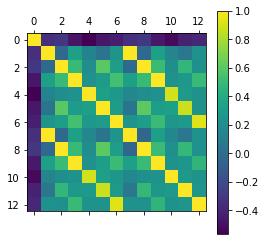

In [50]:
matshow(bijectors.get_log_stats(post_samples, post_bounds)['corr'])
colorbar();

F0 = 153.0844232187524 Hz
[   6.53234326  508.65644954 1823.32627732 2444.54921497   42.56847773
   72.36999934   85.05622379]
[ 254.77027968  359.30229371  547.17681543  665.05291174  786.78752488
 1122.7811971  1436.29381655 1637.52047967 1769.85479645 2632.26897482] [ 458.2157708   226.77686306  576.13194197 2166.84114138  342.76250903
 2177.32469631  232.6842639    51.35190858  510.99765702  288.37452353]


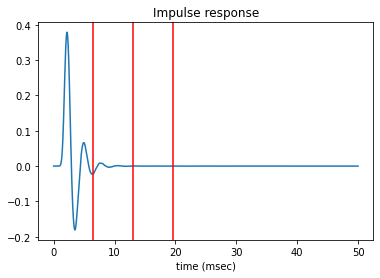

F0 = 156.7368276221421 Hz
[   6.38012148  509.11169322 1592.96288428 3003.1685873    52.55569047
   64.73555175   64.65045475]
[ 241.05738408  426.2022205   558.95886304  806.51504422  930.67565955
 1400.37414554 1572.67880168 1656.50409756 2421.05508697 3047.84462118] [ 129.93486945 1056.47791272  337.94473108  776.16577231  883.78870156
   77.51989424  362.15945404  191.83295641  843.92510109  173.37132913]


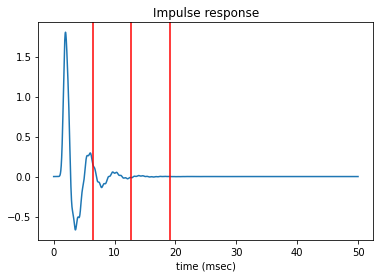

F0 = 183.15037650470015 Hz
[   5.45999424  888.98732334 2704.4234048  3304.14740282   55.75827455
   76.8583289   103.82730436]
[ 664.93062219  986.82496746 1347.48111465 1718.05975281 2033.11166436
 2421.29532138 2328.95288157 2416.67164383 2571.66233117 3005.49210895] [ 218.33455882  311.35217503 1432.30368375  403.22817595  210.3309715
  875.4820407   197.29650752  866.12520767  611.33374978  124.08229574]


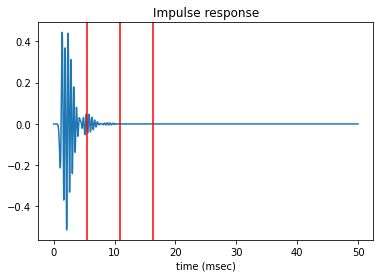

F0 = 159.67879029223806 Hz
[   6.26257249  521.54238742 2703.30426444 3540.32058996   51.71790659
   85.4121106   171.8829049 ]
[ 261.10938965  622.6966517  1013.90682548 1513.03859904 1934.90450459
 2221.01988904 2632.18614582 3304.256567   3819.29977912 4292.67331297] [ 590.03636991  334.72666901  244.65432584  410.20842301  439.04994671
 1154.83507795  403.05255813   85.95346346  647.60094713 2543.75733303]


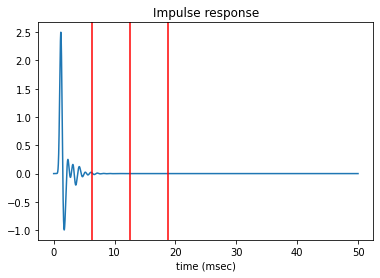

F0 = 182.11868129672152 Hz
[   5.49092489  395.40161466 1757.53462535 2742.27511329   43.92003606
   40.04533402  180.59065497]
[ 649.44464157  530.635755    887.46454628 1470.88168068 1925.56404924
 2358.20284691 2232.96678578 2794.89545073 3054.77965781 3005.15991724] [ 155.32478014  106.48227541  340.39399502  156.22158117 1257.78075523
 1825.26763333  388.12313172  563.13598631  407.6324575   876.35595691]


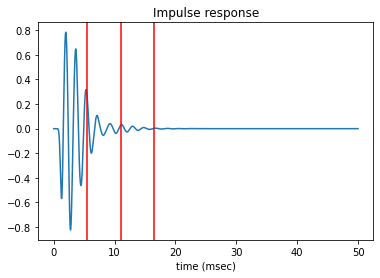

F0 = 152.0041383796054 Hz
[   6.57876825  451.64973364 1504.17144263 2882.62093176   46.39465759
   36.28267772  114.57012059]
[ 329.40398829  547.96491733  942.13853956 1442.22534975 1949.30093932
 2059.03534334 2115.43688699 2651.65246215 3192.3115792  3368.06760108] [ 121.3010628   243.38384136  763.47906625 1553.12559648  313.37820225
 1087.34552662   60.30107332  514.51857654  337.7796808   646.49244237]


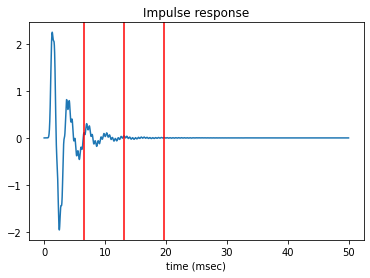

F0 = 201.2373603936691 Hz
[   4.9692562   514.82063307 2210.95361176 2797.21355154   46.76232803
   81.09046911  292.51751405]
[ 505.71269679  536.78149502 1070.31404823 1486.89566206 1398.49277055
 1468.41637335 1765.68977445 1784.82764696 2284.79467184 3211.4379886 ] [ 112.2848759   194.7161431   602.96846358 1706.20540155 1393.15386558
   99.73921936  403.71897891  694.9135885   689.27191782  829.54235573]


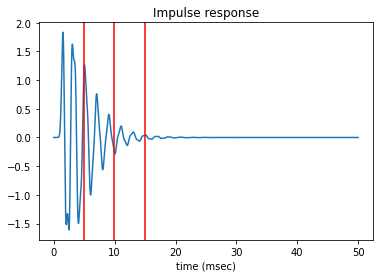

F0 = 117.05364947562452 Hz
[   8.54309118  639.21630273 1320.26925648 1960.46746388   29.72445318
   33.50173074   73.42046977]
[ 498.86382361  789.64258556 1385.27091281 1362.91278393 1767.57514656
 1695.9455488  1667.99164565 1943.64766649 1860.24941395 2236.63526198] [192.62766098 347.60126468 419.01308116 402.36364845 278.76373962
 556.24320458 321.93884294 498.03507123 794.85102324 128.49032211]


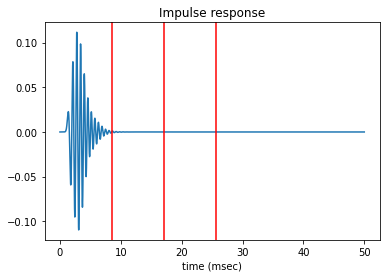

F0 = 172.59616552625405 Hz
[   5.79387147  750.13603077 1701.28957853 2704.35407963   61.10552206
   67.6195615    86.69912471]
[ 493.09194954  726.91493927  858.65229124 1643.24248633 1510.32579767
 1643.81667844 1819.23849222 2280.59972011 2573.61420553 2457.82120393] [ 359.63507234  147.19017207  533.16732418  276.6555144    74.3587087
  825.71152674   58.27951321 1405.87775056   85.9897125   783.00259994]


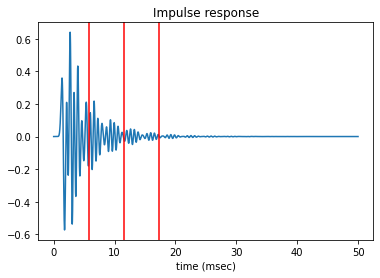

F0 = 85.41477707678459 Hz
[  11.70757607  445.52425111 1252.09227192 2269.73300557   26.74219352
   46.97565749   79.66239955]
[ 264.53214556  227.63473659  437.28220441  838.7902073  1166.27521225
 1916.42984786 1689.91690962 1741.01664577 2190.95811068 2353.9884775 ] [2569.34060072  146.41532727  643.84232967 1446.52244144  202.40023264
  269.20908592  795.28598724   59.71306869 1567.6155471   169.63698031]


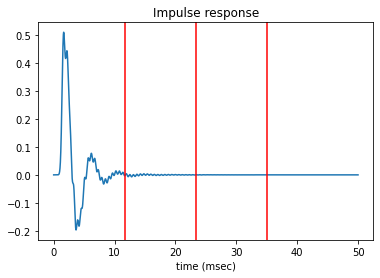

In [68]:
def unpack_sample(s):
    TFB = sample[:7]
    xy = sample[7:]
    return TFB, xy

for i in range(10):
    sample = b.forward(randz())
    TFB, xy = unpack_sample(sample)
    T = TFB[0]
    print("F0 =", 1000/T, "Hz")
    print(TFB)
    x, y = np.split(xy, 2)
    print(x, y)
    
    t, dt = linspace(0, 50, 100000, retstep=True) # msec
    h = vtfilter.impulse_response(t, x, y, vtfilter.randw())
    plot(t, h)
    title("Impulse response")
    xlabel("time (msec)")
    axvline(T, color="red")
    axvline(2*T, color="red")
    axvline(3*T, color="red")
    show()

# peaks, tilt = 1 -71.76137025604393
F = [ 307.9 1734.6 2248.7] [358.]
B = [41.5 74.5 27.3] [204.]


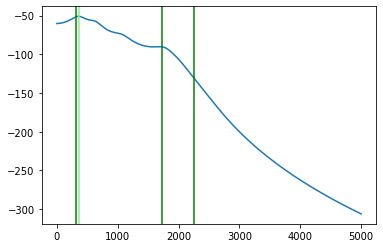

In [82]:
def unpack_TFB(TFB):
    T, F, B = np.split(TFB, [1, 4])
    return T, F, B

for i in range(1):
    sample = b.forward(randz())
    TFB, xy = unpack_sample(sample)
    _, F_true, B_true = unpack_TFB(TFB)
    x, y = np.split(xy, 2)

    f = constants.spectrum_frequencies()
    power = vtfilter.transfer_function_power_dB(f, x, y, vtfilter.randw())

    plot(f, power + i*30, label="our implementation")
    
    nopeaks = spectrum.number_of_peaks(f, power)
    F, B = spectrum.get_formants_from_spectrum(f, power)
    
    print("# peaks, tilt =", nopeaks, spectrum.fit_tilt(f, power))
    print("F =", np.round(F_true, 1), F)
    print("B =", np.round(B_true, 1), np.round(B))
    for Fi in F_true: axvline(Fi, color="green")
    for Fi in F: axvline(Fi, color="lightgreen")

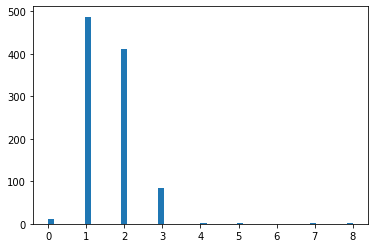

-160.6003126210721

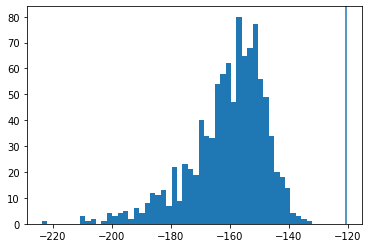

In [70]:
nopeaks = []
tilts = []

f = constants.spectrum_frequencies()

for i in range(1000):
    sample = b.forward(randz())
    TFB, xy = unpack_sample(sample)
    x, y = np.split(xy, 2)

    power = vtfilter.transfer_function_power_dB(f, x, y, vtfilter.randw())

    nopeaks += [spectrum.number_of_peaks(f, power)]
    tilts += [spectrum.fit_tilt(f, power, cutoff=x[-1])]

hist(nopeaks, bins=50);
show()
hist(tilts, bins=50);
axvline(vtfilter.analytical_tilt())
mean(tilts)

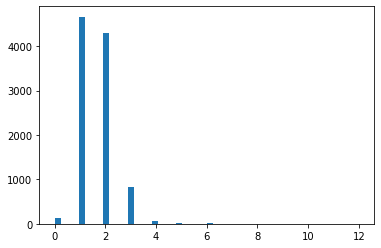

Penalty [ban] for requiring $N_F = 3$ = 1.079876673709276


In [73]:
nopeaks = []
FBs = []

nsamp = 10000

f = constants.spectrum_frequencies()
samples = b.forward(randz(nsamp))

for i in range(nsamp):
    sample = samples[i,:]
    TFB, xy = unpack_sample(sample)
    T, F_ref, B_ref = unpack_TFB(TFB)
    x, y = np.split(xy, 2)

    power = vtfilter.transfer_function_power_dB(f, x, y, vtfilter.randw())
    
    F, B = spectrum.get_formants_from_spectrum(f, power)
    nopeak = len(F)
    
    nopeaks += [nopeak]
    if nopeak == 3:
        FBs += [np.concatenate((F, B))]

hist(nopeaks, bins=50);
show()

proportion = (np.sum(np.array(nopeaks) == 3))/len(nopeaks)
print("Penalty [ban] for requiring $N_F = 3$ =", np.log10(1/proportion))

In [75]:
# K = 3
from lib import util

FB_bounds = bandwidth.TFB_BOUNDS[1:,:]

def fit_mvn_in_log_domain(FB):
    stats = bijectors.get_log_stats(FB, FB_bounds)
    return stats['mean'], stats['cov']

FB_xy = np.vstack(FBs)
FB_ref = bandwidth.sample_TFB()[:,1:]

kl_div = util.kl_mvn(
    fit_mvn_in_log_domain(FB_ref),
    fit_mvn_in_log_domain(FB_xy)
)

util.nats_to_ban(kl_div) + np.log10(1/proportion)

[Memory]4406.1s, 73.4min: Loading get_vtrformants_training_data...
[Memory]4406.3s, 73.4min: Loading run_nested...


3.0819900808816447

In [85]:
b.forward(randz())[7:]

DeviceArray([ 490.29675448,  747.13851807,  992.12581175, 1212.64983478,
             1900.8981002 , 2435.86240837, 2664.34130096, 2919.7015796 ,
             3738.16277931, 4148.62340632,   90.08928798,  162.43904763,
              515.3223018 ,  278.50813328,  188.90042454,  790.29833368,
              430.06162739,  545.05186843, 1484.89789949,  565.87403819],            dtype=float64)

array([   5.47194646,  619.25271335, 1118.94349698, 2372.85499175,
         32.43387327,   42.12817339,  128.57131665,  235.59489768,
        398.28102625,  890.15719033, 1576.07863077, 1558.43318435,
       1791.37363335, 2183.45595385, 2444.57285584, 2990.34898681,
       3162.44181726,  589.22766083,  144.49893974,  257.58878875,
        132.82404301,   69.52596024,  478.9514736 ,  481.47760544,
        449.36022432,  666.85874247, 1747.93543681])